In [24]:
import math

import matplotlib.pyplot as plt
import librosa.feature
import librosa.display
import numpy as np
from IPython.display import Audio, display
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import ruptures as rpt  # our package
import IPython.display as ipd
import pandas as pd


In [25]:
def fig_ax(figsize=(15, 5), dpi=150):
    """Return a (matplotlib) figure and ax objects with given size."""
    return plt.subplots(figsize=figsize, dpi=dpi)

Loaded signal with shape: (4170096,), Sampling rate: 44100


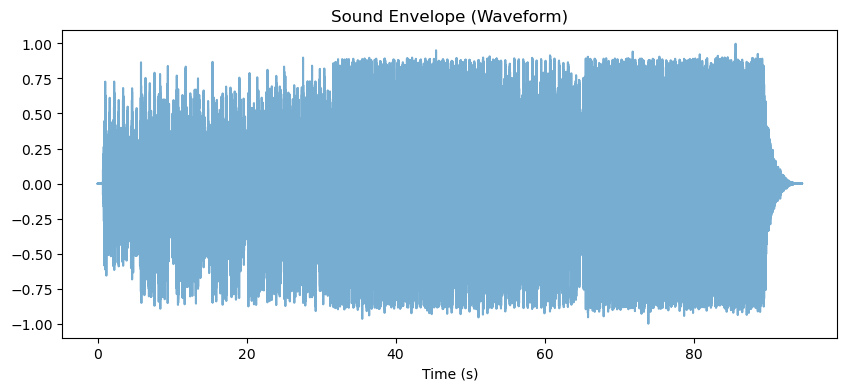

In [26]:
# GET THE SONG DURATION BY FILE
y, sr = librosa.load(r"DO NOT TOUCH/Audio Files/Emmanuel/44. Vitalic - El Viaje.flac", sr=None)
durationOfSong = librosa.get_duration(y=y, sr=sr)

signal, sr = librosa.load(
    r"DO NOT TOUCH/Audio Files/Emmanuel/44. Vitalic - El Viaje.flac",
    sr = None,                                                                      # <-- CAN BE CHANGED :))
    duration=durationOfSong
)

print(f"Loaded signal with shape: {signal.shape}, Sampling rate: {sr}")

# listen to the music
display(Audio(data=signal, rate=sr))

# Plot waveform
time = np.arange(len(signal)) / sr
plt.figure(figsize=(10, 4))
plt.plot(time, signal, alpha=0.6)
plt.xlabel("Time (s)")
plt.title("Sound Envelope (Waveform)")
plt.show()

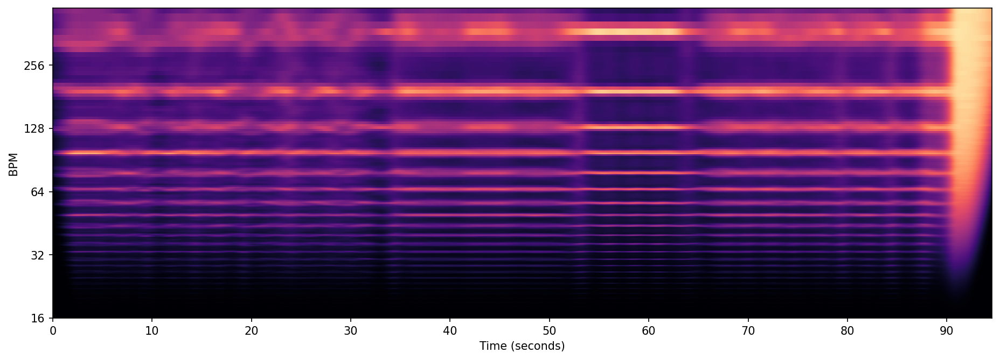

In [27]:
# Compute the onset strength
hop_length_tempo = 512                                                                       # <-- CAN BE CHANGED :))
oenv = librosa.onset.onset_strength(
    y=signal, sr=sr, hop_length=hop_length_tempo
)
# Compute the tempogram
tempogram = librosa.feature.tempogram(
    onset_envelope=oenv,
    sr=sr,
    hop_length=hop_length_tempo,
)
# Display the tempogram
fig, ax = fig_ax()
_ = librosa.display.specshow(
    tempogram,
    ax=ax,
    hop_length=hop_length_tempo,
    sr=sr,
    x_axis="s",
    y_axis="tempo",
)

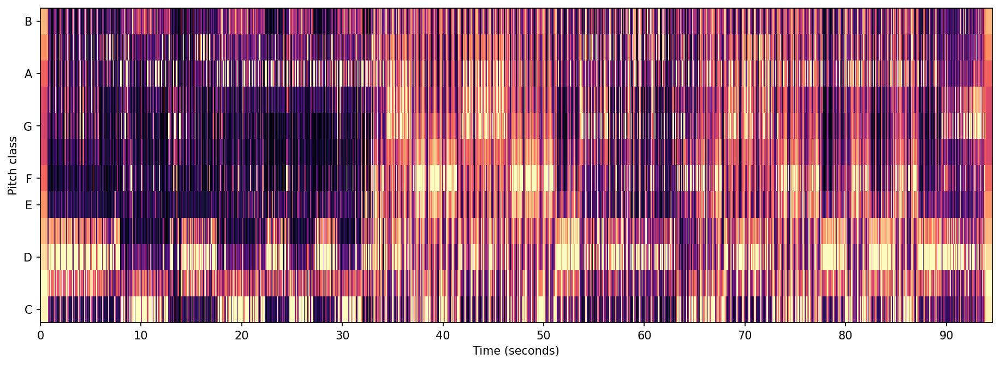

In [28]:
# Compute the Chromagram
# Extract chroma features (try chroma_cqt or chroma_cens)
chroma = librosa.feature.chroma_stft(y=signal, sr=sr, n_chroma=12)                       # <-- CAN BE CHANGED :))  - Go into the packages.. im sorry..

# Normalize chroma features
chroma = librosa.util.normalize(chroma, axis=1)                       # <-- see if this does anything

# Transpose to shape (time_steps, features)
chroma_T = chroma.T  # shape: (frames, 12)

# Display the tempogram
fig, ax = fig_ax()
_ = librosa.display.specshow(
    chroma,
    ax=ax,
    hop_length=hop_length_tempo,
    sr=sr,
    x_axis="s",
    y_axis="chroma",
)

Detected change points: [ 0.53405896  5.4799093   9.92653061 15.74312925 20.67736961 26.26176871
 30.59229025 34.87637188 41.26185941 46.27736961 51.0955102  62.99573696
 77.87972789 83.59183673 88.40997732 92.43863946 94.56326531]


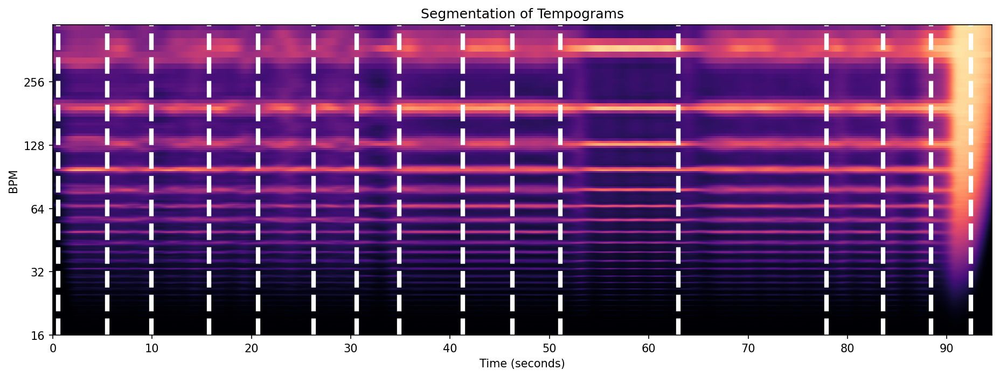

In [29]:
# Choose detection method TEMPOGRAMS
algoTEM = rpt.KernelCPD(kernel="cosine").fit(tempogram.T)                        # <-- CAN BE CHANGED :))

# === TEMPO ALGORITHM NUMBER OF DESIRED CHANGES (bkps) ===
n_bkps = 40                                                                    # <-- CAN BE CHANGED :))
bkpsTEM = algoTEM.predict(n_bkps=n_bkps)
bkps_timesTEM = librosa.frames_to_time(bkpsTEM, sr=sr, hop_length=512)


# === Ensure segments are at least desired seconds apart ===
min_segment_length = 4  # in seconds
filtered_bkps_times = [bkps_timesTEM[0]]  # Always keep the first change point
for b in bkps_timesTEM[1:]:
    if b - filtered_bkps_times[-1] >= min_segment_length:
        filtered_bkps_times.append(b)

# Ensure the final segment reaches the end
if filtered_bkps_times[-1] != bkps_timesTEM[-1]:
    filtered_bkps_times.append(bkps_timesTEM[-1])

# Use filtered breakpoints
bkps_timesTEM = np.array(filtered_bkps_times)

# Now bkps contains the detected change points
print(f"Detected change points: {bkps_timesTEM}")

# Displaying results
fig, ax = fig_ax()
_ = librosa.display.specshow(
    tempogram,
    label= "Segmentation of Tempograms",
    ax=ax,
    x_axis="s",
    y_axis="tempo",
    hop_length=hop_length_tempo,
    sr=sr,
)
# Add title
ax.set_title("Segmentation of Tempograms")

# === TEMPO IS WHITE LINES ===
for b in bkps_timesTEM[:-1]:
    ax.axvline(b, ls="--", color="white", lw=4)

Detected change points: [ 0.70820862  7.91800454 13.17732426 22.31437642 29.50095238 36.74557823
 46.3354195  53.5568254  63.26276644 69.43927438 77.69396825 84.70639456
 91.69560091 94.56326531]


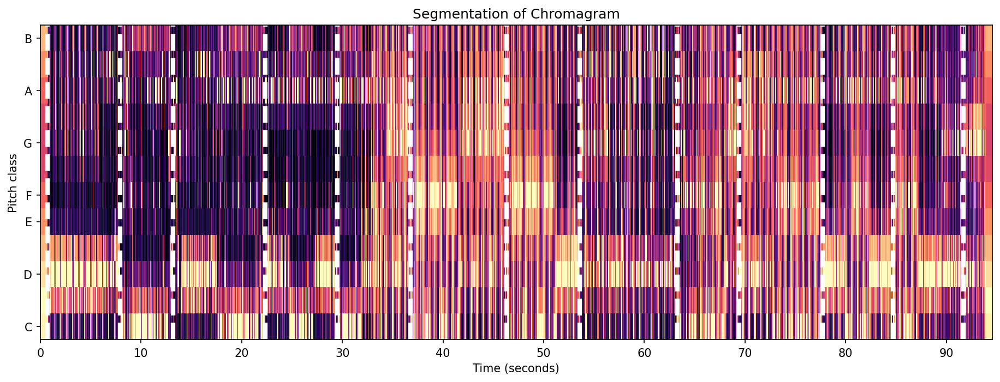

In [30]:
# Choose detection method CHROMAGRAMS
algoCH = rpt.KernelCPD(kernel="rbf").fit(chroma_T)                            # <-- CAN BE CHANGED :))

# === CHROMA ALGORITHM NUMBER OF DESIRED CHANGES (bkps) ===
bkpsCH = algoCH.predict(n_bkps=n_bkps)
bkpsCH_times = librosa.frames_to_time(bkpsCH, sr=sr, hop_length=hop_length_tempo)

# === Ensure segments are at least desired seconds apart ===
min_segment_lengthChroma = 5  # in seconds
filtered_bkpsCH_times = [bkpsCH_times[0]]  # Always keep the first change point
for b in bkpsCH_times[1:]:
    if b - filtered_bkpsCH_times[-1] >= min_segment_lengthChroma:
        filtered_bkpsCH_times.append(b)

# Ensure the final segment reaches the end
if filtered_bkpsCH_times[-1] != bkpsCH_times[-1]:
    filtered_bkpsCH_times.append(bkpsCH_times[-1])

# Use filtered breakpoints
bkpsCH_times = np.array(filtered_bkpsCH_times)

# Displaying results
fig, ax = fig_ax()
_ = librosa.display.specshow(
    chroma,
    ax=ax,
    x_axis="s",
    y_axis="chroma",
    hop_length=hop_length_tempo,
    sr=sr,
)
# Add title
ax.set_title("Segmentation of Chromagram")

# === CHROMA IS WHITE LINES ===
for b in bkpsCH_times[:-1]:
    ax.axvline(b, ls="--", color="white", lw=4)

print("Detected change points:", bkpsCH_times)

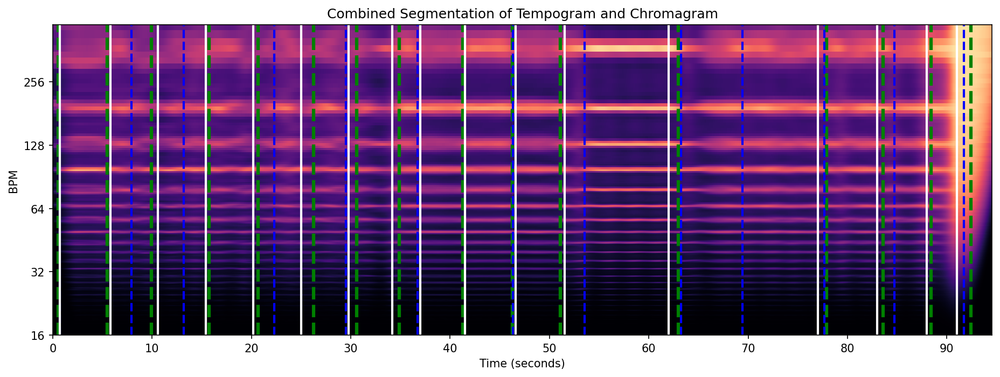

In [31]:
# === NOW COMPARE BOTH WITH GroundTruth ===
# Load GT only TIMESTAMPS
GT = r"C:\Users\xxmal\Documents\GitHub\4. Semester\Music-Structure-Analysis\DO NOT TOUCH\DataProcessing\OurOwnAnnotations\OurCSVData\El_Viaje_OurData.csv"
gt_data = pd.read_csv(GT)
gt_times = gt_data["TIMESTAMP"].values

# display the figure
fig, ax = fig_ax()
# Display the tempogram as the background
_ = librosa.display.specshow(
    tempogram,
    ax=ax,
    x_axis="s",
    y_axis="tempo",
    hop_length=hop_length_tempo,
    sr=sr,
)
# Title
ax.set_title("Combined Segmentation of Tempogram and Chromagram")


# === TEMPO IS GREEN LINES ===
for b in bkps_timesTEM[:-1]:
    ax.axvline(b, ls="--", color="green", lw=3, label="Tempo Segmentation" if b == bkps_timesTEM[0] else None)

# === CHROMA IS RED LINES ===
for b in bkpsCH_times[:-1]:
    ax.axvline(b, ls="--", color="blue", lw=2, label="Chromagram Segmentation" if b == bkpsCH_times[0] else None)

# === GroundTruth IS WHITE LINES ===
for b in gt_times:
    ax.axvline(b, ls="-", color="white", lw=2, label="Ground Truth" if b == gt_times[0] else None)
plt.show()


In [32]:
# === CALCULATES SCORE WITHIN 3s OF GT ====
def gaussian_score_flat_top(time_diff, sigma=0.9, flat_top=0.25):
    abs_diff = abs(time_diff)
    if abs_diff <= flat_top:
        return 100.0
    elif abs_diff >= 3:
        return 0.0
    else:
        adjusted_diff = abs_diff - flat_top
        return 100.0 * math.exp(- (adjusted_diff ** 2) / (2 * sigma ** 2))

# === Load ground truth from CSV ===
ground_truth_path = r"DO NOT TOUCH/DataProcessing/OurOwnAnnotations/OurCSVData/El_Viaje_OurData.csv"
gt_times = pd.read_csv(ground_truth_path)['TIMESTAMP'].values  # Extract only 'TIMESTAMP' column

# === Scoring function ===
def evaluate_segmentation(predicted_times, gt_times, label=""):
    scores = []
    matched_preds = []

    for gt in gt_times:
        if len(predicted_times) == 0:
            scores.append(0.0)
            matched_preds.append(None)
            continue
        closest_pred = min(predicted_times, key=lambda p: abs(p - gt))
        matched_preds.append(closest_pred)
        time_diff = closest_pred - gt
        score = gaussian_score_flat_top(time_diff)
        scores.append(score)

    # === Print results ===
    print(f"\n--- Evaluation Results for {label} ---")
    for i, (gt, pred, score) in enumerate(zip(gt_times, matched_preds, scores), 1):
        if pred is not None:
            print(f"{i:02}: GT={gt:.2f}s | Closest Pred={pred:.2f}s | Diff={pred - gt:+.2f}s | Score={score:.2f}")
        else:
            print(f"{i:02}: GT={gt:.2f}s | Closest Pred=None | Diff=None | Score=0.00")

    avg_score = np.mean(scores)
    print(f"\nAverage Score for {label}: {avg_score:.2f}\n")
    return scores, avg_score

# === Evaluate TEMPO ===
tempo_scores, avg_tempo_score = evaluate_segmentation(bkps_timesTEM, gt_times, label="Tempo")

# === Evaluate CHROMAGRAM ===
chroma_scores, avg_chroma_score = evaluate_segmentation(bkpsCH_times, gt_times, label="Chromagram")



--- Evaluation Results for Tempo ---
01: GT=0.70s | Closest Pred=0.53s | Diff=-0.17s | Score=100.00
02: GT=5.79s | Closest Pred=5.48s | Diff=-0.31s | Score=99.78
03: GT=10.59s | Closest Pred=9.93s | Diff=-0.66s | Score=89.98
04: GT=15.39s | Closest Pred=15.74s | Diff=+0.35s | Score=99.35
05: GT=20.19s | Closest Pred=20.68s | Diff=+0.49s | Score=96.58
06: GT=24.99s | Closest Pred=26.26s | Diff=+1.27s | Score=52.50
07: GT=29.79s | Closest Pred=30.59s | Diff=+0.80s | Score=82.84
08: GT=34.16s | Closest Pred=34.88s | Diff=+0.72s | Score=87.44
09: GT=36.98s | Closest Pred=34.88s | Diff=-2.10s | Score=11.99
10: GT=41.50s | Closest Pred=41.26s | Diff=-0.24s | Score=100.00
11: GT=46.60s | Closest Pred=46.28s | Diff=-0.32s | Score=99.67
12: GT=51.53s | Closest Pred=51.10s | Diff=-0.43s | Score=97.92
13: GT=62.00s | Closest Pred=63.00s | Diff=+1.00s | Score=70.94
14: GT=77.00s | Closest Pred=77.88s | Diff=+0.88s | Score=78.29
15: GT=83.00s | Closest Pred=83.59s | Diff=+0.59s | Score=93.04
16: G

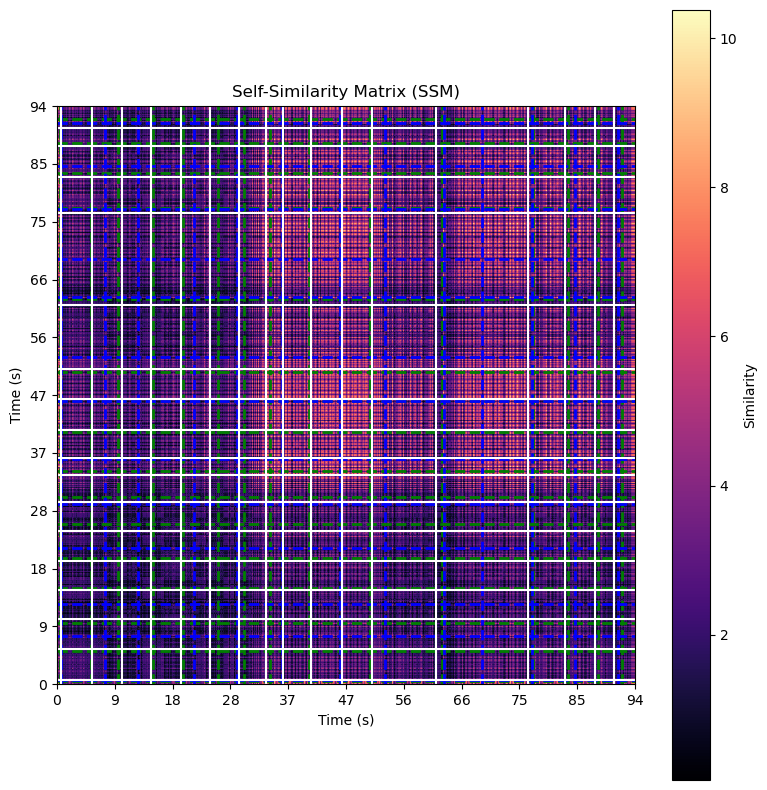

Expected duration: 94.56
Number of frames: 8145
Time at last frame: 94.56326530612245


In [33]:
hop_length = 512

# --- Compute the chromagram ---
chroma = librosa.feature.chroma_stft(y=y, sr=sr, hop_length=hop_length)
chroma_norm = librosa.util.normalize(chroma, axis=0)

# --- Compute the Self-Similarity Matrix (SSM) ---
ssm = np.dot(chroma_norm.T, chroma_norm)
duration = librosa.get_duration(y=y, sr=sr)  # actual duration in seconds
n_frames = int(np.ceil(duration * sr / hop_length))  # total expected number of frames

# --- Convert segmentation times (in seconds) to frame indices ---
def seconds_to_frames(times_in_seconds, sr, hop_length):
    return (np.array(times_in_seconds) * sr / hop_length).astype(int)

bkpsTEM_frames = np.clip(seconds_to_frames(bkps_timesTEM, sr, hop_length), 0, n_frames - 1)
bkpsCH_frames = np.clip(seconds_to_frames(bkpsCH_times, sr, hop_length), 0, n_frames - 1)
gt_frames = np.clip(seconds_to_frames(gt_times, sr, hop_length), 0, n_frames - 1)

# --- Convert frame indices to times for tick labels ---
frame_times = librosa.frames_to_time(np.arange(n_frames), sr=sr, hop_length=hop_length)
tick_spacing = max(1, int(n_frames / 10))  # ~10 ticks
tick_positions = np.arange(0, n_frames, tick_spacing)
tick_labels = frame_times[tick_positions].astype(int)

# --- Plot the SSM ---
plt.figure(figsize=(8, 8))
plt.imshow(ssm, origin='lower', cmap='magma', interpolation='nearest', aspect='equal')
plt.title('Self-Similarity Matrix (SSM)')
plt.xlabel('Time (s)')
plt.ylabel('Time (s)')
plt.colorbar(label='Similarity')

# --- Set tick marks to show time in seconds ---
plt.xticks(tick_positions, tick_labels)
plt.yticks(tick_positions, tick_labels)

# --- Overlay segmentation lines ---
for i, b in enumerate(bkpsTEM_frames[:-1]):
    plt.axvline(b, color='green', lw=2, linestyle='--', label='Tempo Segmentation' if i == 0 else None)
    plt.axhline(b, color='green', lw=2, linestyle='--')

for i, b in enumerate(bkpsCH_frames[:-1]):
    plt.axvline(b, color='blue', lw=2, linestyle='--', label='Chromagram Segmentation' if i == 0 else None)
    plt.axhline(b, color='blue', lw=2, linestyle='--')

for i, b in enumerate(gt_frames):
    plt.axvline(b, color='white', lw=1.5, linestyle='-', label='Ground Truth' if i == 0 else None)
    plt.axhline(b, color='white', lw=1.5, linestyle='-')

# --- Final touches ---
plt.xlim(0, n_frames)
plt.ylim(0, n_frames)
#plt.legend(loc='upper right')
plt.tight_layout()
plt.show()

print("Expected duration:", duration)
print("Number of frames:", n_frames)
print("Time at last frame:", librosa.frames_to_time(n_frames, sr=sr, hop_length=hop_length))